In [1]:
import os
from os.path import isdir, join
from pathlib import Path
import pandas as pd

import numpy as np
from scipy.fftpack import fft
from scipy import signal
from scipy.io import wavfile
import librosa

from sklearn.decomposition import PCA

import matplotlib.pyplot as plt
import seaborn as sns
import IPython.display as ipd
import librosa.display

import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import pandas as pd

%matplotlib inline
audio_path = 'C:/tmp/speech_commands_v0.01/'

# Analiza podataka


## 1. Istraživanje dataseta

Zvučne datoteke su organizirane u mape na temelju riječi koju sadrže. Provjerimo koliko je riječi (oznaka), te broj riječi određene oznake.

In [2]:
dirs = [f for f in os.listdir(audio_path) if isdir(join(audio_path, f))]
dirs.sort()
print('Broj oznaka (labels): ' + str(len(dirs)))

Broj oznaka (labels): 31


Dakle, ukupno je 31 oznaka, od kojih mi trebamo prepoznati 10 (Yes, No, Up, Down, Left, Right, On, Off, Stop, Go), ostale oznake označavamo s 'unknown', a ako zvučna datoteka ne sadrži riječ, odnosno sadrži samo pozadinski šum (background noise) označavamo ju s 'silence'. Dakle, imamo 12 klasa.

In [6]:
number_of_recordings = []
for direct in dirs:
    waves = [f for f in os.listdir(join(audio_path, direct)) if f.endswith('.wav')]
    number_of_recordings.append(len(waves))

data = [go.Histogram(x=dirs, y=number_of_recordings)]
trace = go.Bar(
    x=dirs,
    y=number_of_recordings,
    marker=dict(color = number_of_recordings, colorscale='Viridius', showscale=True
    ),
)
layout = go.Layout(
    title='Broj datoteka za svaku oznaku',
    xaxis = dict(title='Riječi'),
    yaxis = dict(title='Broj datoteka')
)
py.iplot(go.Figure(data=[trace], layout=layout))

Uočavamo da su datoteke poprilično jednoliko raspoređene po oznakama, osim pozadinskog šuma, ali pozadinski šum je predstavljen dužim zvučnim zapisima koje ćemo kasnije prilagoditi i pomiješati s ostalima.

Prema opisu dataseta, zvučni zapisi trebali bi trajati 1 sekundu. Provjerimo to:

In [7]:
num_of_shorter = 0
for direct in dirs:
    if direct == "_background_noise_":
        continue
    waves = [f for f in os.listdir(join(audio_path, direct)) if f.endswith('.wav')]
    for wav in waves:
        sample_rate, samples = wavfile.read(audio_path + direct + '/' + wav)
        if samples.shape[0] < sample_rate:
            num_of_shorter += 1
print('Broj zapisa kracih od 1 s: ' + str(num_of_shorter))

Broj zapisa kracih od 1 s: 6469


6469 zapisa kraćih od 1s, nadopuniti ćemo ih nulama.

## 2. Raw

Dataset se sastoji od zvučnih datoteka u .wav formatu, .wav format je niz uzoraka (samples). Uzorak (sample) je cjelobrojna vrijednost amplitude zvučnog vala s obzirom na određenu brzinu (sample rate) tj. broj uzoraka koji postoji za svaku sekundu. ([Više informacija o .wav](https://blogs.msdn.microsoft.com/dawate/2009/06/23/intro-to-audio-programming-part-2-demystifying-the-wav-format/))

Pogledajmo to na primjeru jedne datoteke:

In [8]:
filename = '/dog/00f0204f_nohash_1.wav'
sample_rate, samples = wavfile.read(str(audio_path) + filename)

print(sample_rate,samples.shape)

16000 (16000,)


Datoteke u našem datasetu traju 1 sekundu i imaju stopu (sample rate) od 16000 što znači da ćemo učitavanjem datoteke dobiti niz od 16000 cijeli brojeva koji predstavljaju amplitudu zvučnog vala u Hz. Prikažimo taj niz grafički:

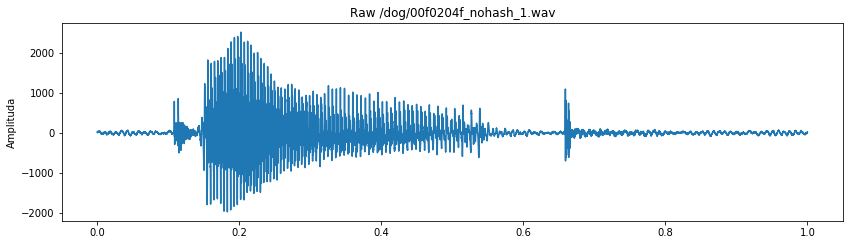

In [9]:
fig = plt.figure(figsize=(14, 8))
ax1 = fig.add_subplot(211)
ax1.set_title('Raw ' + filename)
ax1.set_ylabel('Amplituda')
ax1.plot(np.linspace(0, sample_rate/len(samples), sample_rate), samples)

##  3. Spektogram

Spektogram je vizualna reprezentacija spektruma frekvencija zvuka. Spektogram prikazujemo kao graf s frekvencijom na jednoj osi, vremenom na drugoj, dok 3. dimenziju predstavljamo intenzitetom boje svake točke, što označava amplitudu određene frekvencije u određenom vremenu. ([Više o spektogramima](https://en.wikipedia.org/wiki/Spectrogram))

Definirajmo funkciju za računanje spektograma, uzimamo logaritam od vrijednosti spektograma kako bi imali čišći grafički prikaz. Također, logaritam nesmije primiti 0.

In [10]:
def log_specgram(audio, sample_rate, window_size=20,
                 step_size=10, eps=1e-10):
    nperseg = int(round(window_size * sample_rate / 1e3))
    noverlap = int(round(step_size * sample_rate / 1e3))
    freqs, times, spec = signal.spectrogram(audio,
                                    fs=sample_rate,
                                    window='hann',
                                    nperseg=nperseg,
                                    noverlap=noverlap,
                                    detrend=False)
    return freqs, times, np.log(spec.T.astype(np.float32) + eps)

Raspon frekvencije će biti od 0 do 8000 ( < 16000 / 2 prema  [Nyquist theorem](https://en.wikipedia.org/wiki/Nyquist%E2%80%93Shannon_sampling_theorem)) 

Text(0.5,0,'Sekunde')

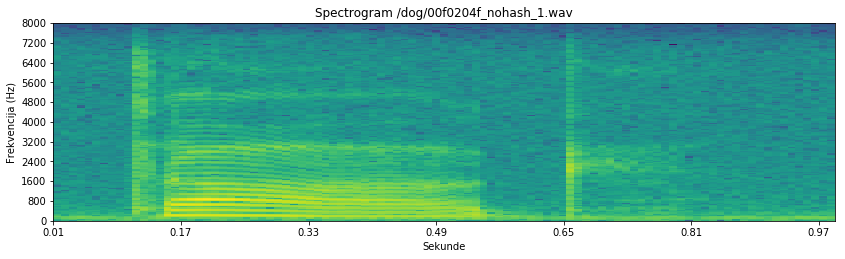

In [11]:
freqs, times, spectrogram = log_specgram(samples, sample_rate)

fig = plt.figure(figsize=(14, 8))
ax2 = fig.add_subplot(212)
ax2.imshow(spectrogram.T, aspect='auto', origin='lower', 
           extent=[times.min(), times.max(), freqs.min(), freqs.max()])
ax2.set_yticks(freqs[::16])
ax2.set_xticks(times[::16])
ax2.set_title('Spectrogram ' + filename)
ax2.set_ylabel('Frekvencija (Hz)')
ax2.set_xlabel('Sekunde')

In [12]:
print(spectrogram.shape)


(99, 161)


Dakle imamo oko 160 značajki za svakih 0.01 s zvuka, odnosno jedna značajka predstavlja oko 50 Hz.

Kada bi upotrjebili spektograme kao ulaz u neuronsku mrežu bilo bi potrebno i normalizirati ih kroz cijeli dataset:

In [13]:
mean = np.mean(spectrogram, axis=0)
std = np.std(spectrogram, axis=0)
spectrogram = (spectrogram - mean) / std

## 4. MFCC

Mel-frequency cepstral coefficients su koeficijenti koji čine mel-frequency cepstrum (MFC) koji prikazuje kratkotrajni spektar snage zvuka. Mel-frequency cepstral koeficijenti se koriste kako bi se opisala tekstura zvuka te za  oponašanje svojstava ljudskog sluha. ([Više o MFCC](http://practicalcryptography.com/miscellaneous/machine-learning/guide-mel-frequency-cepstral-coefficients-mfccs/))

Za računanje Mel power spektograma i MFCC-a koristimo librosa paket za python. ([Librosa Demo](https://github.com/librosa/librosa/blob/master/examples/LibROSA%20demo.ipynb))

Prvo izračunamo Mel spectogram iz zvučnog valnog oblika (raw .wav). 

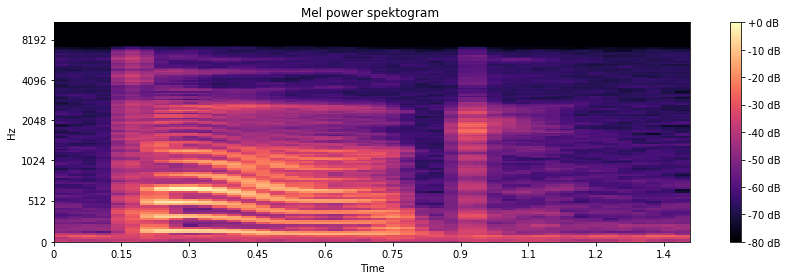

In [14]:

sample, rate = librosa.load(audio_path+filename)

S = librosa.feature.melspectrogram(sample, sr=sample_rate, n_mels=128)

# Convert to log scale (dB). We'll use the peak power (max) as reference.
log_S = librosa.power_to_db(S, ref=np.max)

plt.figure(figsize=(12, 4))
librosa.display.specshow(log_S, sr=sample_rate, x_axis='time', y_axis='mel')
plt.title('Mel power spektogram ')
plt.colorbar(format='%+02.0f dB')
plt.tight_layout()

zatim izdvajamo 13 najboljih Mel-frequency cepstral koeficijenta

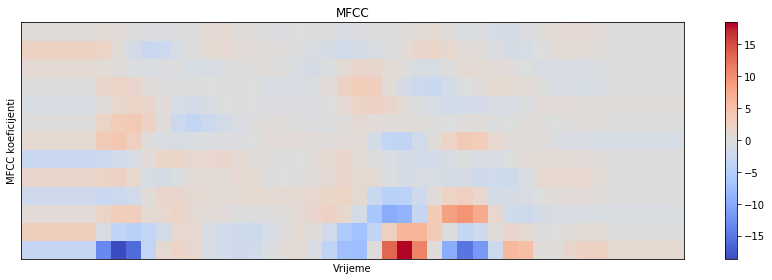

In [15]:
mfcc = librosa.feature.mfcc(S=log_S, n_mfcc=13)

# Let's pad on the first and second deltas while we're at it
delta2_mfcc = librosa.feature.delta(mfcc, order=2)

plt.figure(figsize=(12, 4))
librosa.display.specshow(delta2_mfcc)
plt.ylabel('MFCC koeficijenti')
plt.xlabel('Vrijeme')
plt.title('MFCC')
plt.colorbar()
plt.tight_layout()

## 5. Smanjivanje dimenzionalnosti

Snimke su uzorkovane (sampled) s frekvencijom od 16000 Hz. Većina frekvencija vezanih uz ljudski govor se nalaze u manjem rasponu. Npr. mobilni GSM signal je uzorkovan (sampled) u frekvencijama do 8000 Hz.

Dakle ako preradimo naše datoteke frekvencijom do 8000 Hz, možemo odbaciti neke nepotrebne informacije i smanjiti veličinu podataka.

To možemo provjeriti računanjem FTT (Fast Fourier Transform). Definirajmo funkciju:


In [16]:
def custom_fft(y, fs):
    T = 1.0 / fs
    N = y.shape[0]
    yf = fft(y)
    xf = np.linspace(0.0, 1.0/(2.0*T), N//2)
    vals = 2.0/N * np.abs(yf[0:N//2])  # FFT is simmetrical, so we take just the first half
    # FFT is also complex, to we take just the real part (abs)
    return xf, vals

Pogledjamo što se događa na primjeru datotoeke:

In [17]:
filename = '/yes/0a7c2a8d_nohash_0.wav'
new_sample_rate = 8000

sample_rate, samples = wavfile.read(str(audio_path) + filename)
resampled = signal.resample(samples, int(new_sample_rate/sample_rate * samples.shape[0]))

Poslušajmo razliku u datotekama na 16 kHz i 8 Khz

In [18]:
ipd.Audio(samples, rate=sample_rate)

In [19]:
ipd.Audio(resampled, rate=new_sample_rate)

Usporedimo FFT:

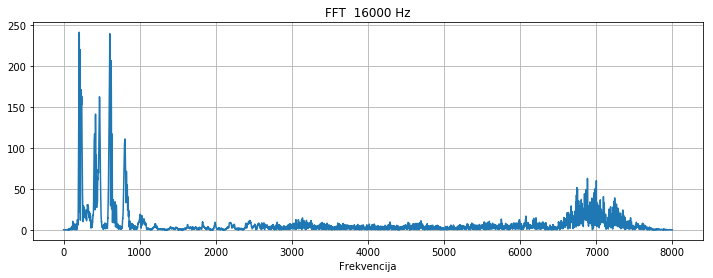

In [20]:
xf, vals = custom_fft(samples, sample_rate)
plt.figure(figsize=(12, 4))
plt.title('FFT  ' + str(sample_rate) + ' Hz')
plt.plot(xf, vals)
plt.xlabel('Frekvencija')
plt.grid()
plt.show()

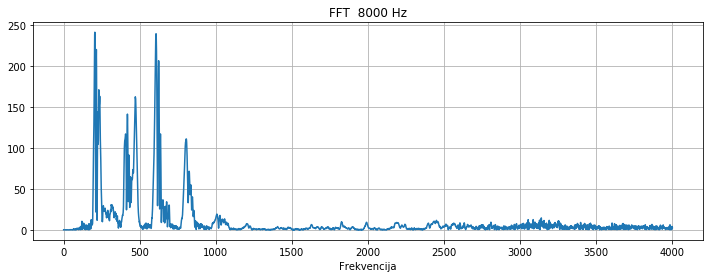

In [21]:
xf, vals = custom_fft(resampled, new_sample_rate)
plt.figure(figsize=(12, 4))
plt.title('FFT  ' + str(new_sample_rate) + ' Hz')
plt.plot(xf, vals)
plt.xlabel('Frekvencija')
plt.grid()
plt.show()

Uočimo, iznad 4000 Hz gotovo da i nema informacija, na ovaj način smo smanjili veličinu dataseta na pola.

## 6. Otkrivanje odstupanja

Provjerimo da li ima datoteka koje odstupaju od ostalih s obziroom na FFT vrijednsti koristeći PCA (Principal component analysis). Možda možemo dodatno smanjiti dimenzionalnost.

In [22]:
fft_all = []
names = []
for direct in dirs:
    if direct == "_background_noise_":
        continue
    waves = [f for f in os.listdir(join(audio_path, direct)) if f.endswith('.wav')]
    for wav in waves:
        sample_rate, samples = wavfile.read(audio_path + direct + '/' + wav)
        if samples.shape[0] != sample_rate:
            samples = np.append(samples, np.zeros((sample_rate - samples.shape[0], )))
        x, val = custom_fft(samples, sample_rate)
        fft_all.append(val)
        names.append(direct + '/' + wav)

fft_all = np.array(fft_all)

# Normalization
fft_all = (fft_all - np.mean(fft_all, axis=0)) / np.std(fft_all, axis=0)

# Dim reduction
pca = PCA(n_components=3)
fft_all = pca.fit_transform(fft_all)

def interactive_3d_plot(data, names):
    scatt = go.Scatter3d(x=data[:, 0], y=data[:, 1], z=data[:, 2], mode='markers', text=names)
    data = go.Data([scatt])
    layout = go.Layout(title="Odstupanja")
    figure = go.Figure(data=data, layout=layout)
    py.iplot(figure)
    
interactive_3d_plot(fft_all, names)

Uočavamo nekoliko zapisa koja se nalaze daleko od ostalih, poslušajmo neke od njih ih:

In [26]:
ipd.Audio(join(audio_path, 'sheila/6940f7f3_nohash_0.wav'))

In [25]:
ipd.Audio(join(audio_path, 'house/5165cf0a_nohash_1.wav'))

In [28]:
ipd.Audio(join(audio_path, 'yes/e4b02540_nohash_0.wav'))

Ne uočavamo nikakva značajna odstupanja. Zaključujemo da dataset sadrži što bi trebao sadržavati. Osim možda sljedeće datoteke:

In [27]:
ipd.Audio(join(audio_path, 'seven/b1114e4f_nohash_0.wav'))